In this notebook, all the used tactics for backgroundcorrecting and finding particles are used and compared. 
My aim is to write different functions for all of them, so that they can easily  be called upon.


In [25]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation
from matplotlib.animation import FuncAnimation
import time

from Particledrop import Landing_Flashes

import trackpy


Call this function to execute an animation. Change the interval value to change the speed

In [26]:
def execute_amovie(moviedata):
    plt.rcParams["animation.html"] = "jshtml"
    plt.rcParams['figure.dpi'] = 100  
    plt.ioff()
    
    fig = plt.figure()
    axis = plt.axes()
    
    film = plt.imshow(moviedata[0])
    
    def init(): 
        film.set_data(moviedata[0])
        return [film]
    
    def animate(i):
        film.set_array(moviedata[i])
        return [film]
    
    anim = FuncAnimation(fig, animate, frames = moviedata.shape[0], init_func = init, interval = 200, blit = True)

    return anim

First, define all the operating functions on the dataset:

In [78]:
#Do simple backgroundcorrection
#Simple mode: Take off the reference (= median), divide by reference - dark
#Dark value is now set to 5 in the simulation, could be a variable.
#If we put it to 5 here as well, you can get a divide by 0 if there's no noise
def Simple_backgroundcor(mov):
    bg = np.median(mov,axis=0)

    backgroundcor = np.zeros((nf,mov[0].shape[0],mov[0].shape[1]))

    dark = np.ones((fov))*5
    for i in range(nf):
        backgroundcor[i] = (mov[i] - bg)/(bg-dark)

    #Set negative values to 0 
    backgroundcor[backgroundcor<0] = 0  
    
    return backgroundcor

#The moving average takes off the mean of the past few frames.
#Very usefull in combination with trackpy batch and linking

def BGCMovingAverage(movie):
    start = 6
    end = nf

    BGCma = movie[start:end,:,:] - np.mean([movie[start-5:end-5,:,:],
                                          movie[start-4:end-4,:,:],
                                          movie[start-3:end-3,:,:],
                                          movie[start-2:end-2,:,:],
                                          movie[start-1:end-1,:,:]],
                                          axis = 0)
    #Normalization could be important
    BGCma2 = BGCma/movie[0]
    return BGCma2

#This function makes a Histogram of all intensities in a movie. Use this 
def Histogram_intensities(movie):
    movielist = movie.flatten()

    fig, ax = plt.subplots()
    plt.title('Intensities in movie:')
    ax.hist(movielist, bins = 30)
    
def Cutoff_movie(movie, cutoff):
    movie_cutoff = np.where(movie < cutoff, 0, movie)
    return movie_cutoff

#For the Fourier transform, it's good to start with images before doing the entire movie
#These are functions for Fourier transforming and plotting an image
from scipy import fftpack
def fft_img(img):
    im_fft = fftpack.fft2(img)
    return im_fft

def plot_spectrum(im_fft):
    from matplotlib.colors import LogNorm
    # A logarithmic colormap
    plt.figure()
    plt.title('Fourier transform')
    plt.imshow(np.abs(im_fft), norm=LogNorm(vmin=5))
    plt.colorbar()

#This function cuts off a lot of the fft, it keeps a given fraction in the corners (stolen from internet)
#and returns the reconstructed image from that cutoff

# Define the fraction of coefficients (in each direction) we keep: keep_fraction

def fft_cutoff(im_fft, keep_fraction):
    # In the lines following, we'll make a copy of the original spectrum and
    # truncate coefficients.
    
    # Call ff a copy of the original transform. Numpy arrays have a copy
    # method for this purpose.
    im_fft2 = im_fft.copy()

    # Set r and c to be the number of rows and columns of the array.
    r, c = im_fft2.shape

    # Set to zero all rows with indices between r*keep_fraction and
    # r*(1-keep_fraction):
    im_fft2[int(r*keep_fraction):int(r*(1-keep_fraction))] = 0

    # Similarly with the columns:
    im_fft2[:, int(c*keep_fraction):int(c*(1-keep_fraction))] = 0

    plt.figure()
    plot_spectrum(im_fft2)
    plt.title('Filtered Spectrum')
    
    # Reconstruct the denoised image from the filtered spectrum, keep only the
    # real part for display.
    im_new = fftpack.ifft2(im_fft2).real

    plt.figure()
    plt.imshow(im_new)
    plt.title('Reconstructed Image')
    return im_new

def fft_cutoff_noplot(im_fft, keep_fraction):
    im_fft2 = im_fft.copy()
    r, c = im_fft2.shape
    im_fft2[int(r*keep_fraction):int(r*(1-keep_fraction))] = 0
    im_fft2[:, int(c*keep_fraction):int(c*(1-keep_fraction))] = 0
    im_new = fftpack.ifft2(im_fft2).real
    return im_new
    
def fft_cutoff_movie(movie, keep_fraction):
    keepfraction = keep_fraction
    movie_new = []
    for i in range(movie.shape[0]):
        img = movie[i]
        img_new = fft_cutoff_noplot(img, keepfraction)
        movie_new.append(img_new)
    movie_new = np.asarray(movie_new)
    return movie_new

Now that's done, let's make a dataset which we'll test the different functions on. Note that the noise is changed in meas.noise=1

Number of particles simulated: 50


(array([6., 4., 2., 2., 5., 8., 6., 5., 8., 4.]),
 array([18.0989095 , 18.48876372, 18.87861793, 19.26847215, 19.65832636,
        20.04818058, 20.4380348 , 20.82788901, 21.21774323, 21.60759744,
        21.99745166]),
 <a list of 10 Patch objects>)

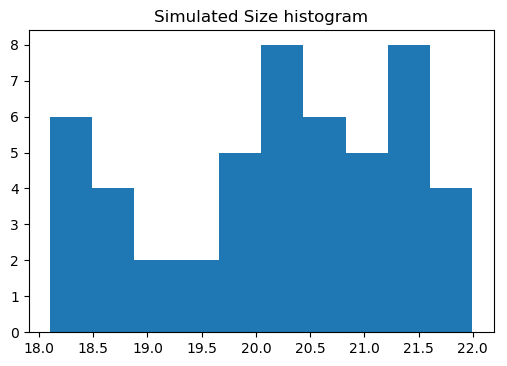

In [28]:
nf = 80
fov=[200,300]
meas = Landing_Flashes(fov=fov, seed=5045, numpar = 50, noise = 0, nframes = nf, signal = 20, sizevar=0.2, dark = 5, psize = 4, unevenIllumination = False)
testframe = nf-1
meas.noise = 1
plis = meas.parlist
movie= meas.genStack()
print('Number of particles simulated:', np.shape(plis)[0])

plt.figure()
plt.title('Simulated Size histogram')
plt.hist(plis[:,2])


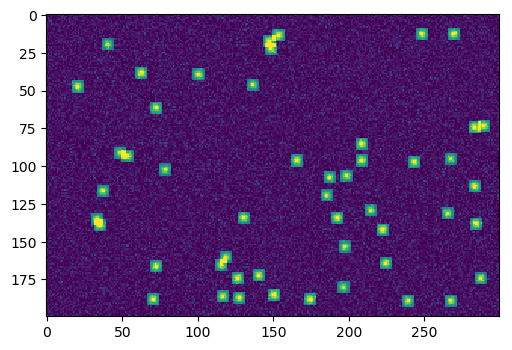

In [75]:
execute_amovie(movie)

C:\Users\sjoer\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in true_divide
  if sys.path[0] == '':
C:\Users\sjoer\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':


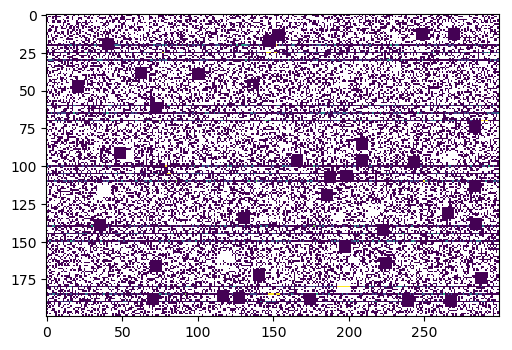

In [31]:
BGsimple = Simple_backgroundcor(movie)
execute_amovie(BGsimple)
#not sure why this doesn't work

If you make a histogram of a movie dataset, you can see where to cutoff. For more examples, see notebook_cutoff_and_fourier. In this example, it's at 11. You see how clean the example already gets, at noise is 1.

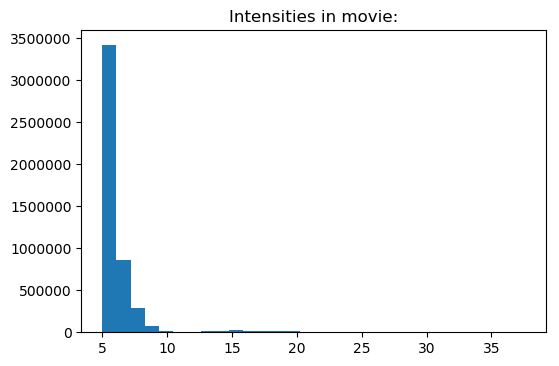

In [37]:
Histogram_intensities(movie)

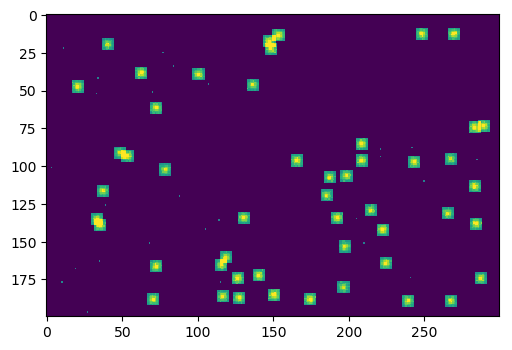

In [40]:
movie_cutoff = Cutoff_movie(movie, 11)
execute_amovie(movie_cutoff)


C:\Users\sjoer\Anaconda3\lib\site-packages\scipy\fftpack\basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


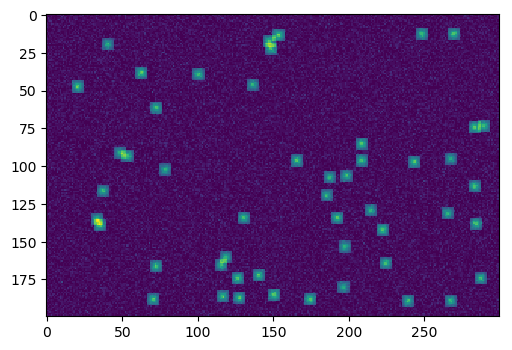

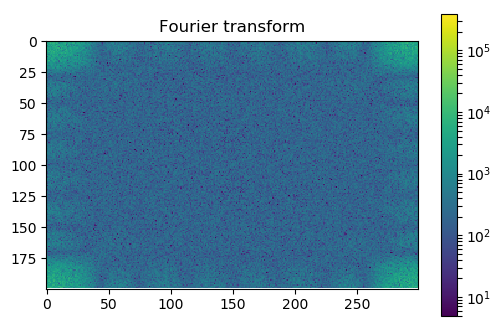

In [49]:
img = movie[testframe]
im_fft = fft_img(img)

plt.figure()
plt.imshow(img)

plot_spectrum(im_fft)


C:\Users\sjoer\Anaconda3\lib\site-packages\scipy\fftpack\basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


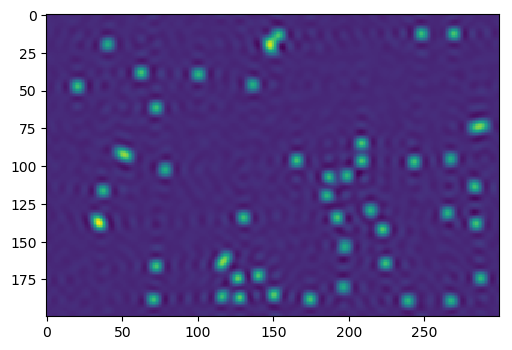

In [71]:
#Remember, the number you put into this is the fraction to keep
fft_cutoff(im_fft, 0.10)


In [ ]:
moviefft = fft_cutoff_movie(movie, 0.10)
execute_amovie(moviefft)
#not sure why this doesn't work


C:\Users\sjoer\Anaconda3\lib\site-packages\scipy\fftpack\basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x
